In [ ]:
!pip install opencv-contrib-python==3.4.0.12 

In [23]:
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [2]:
def parse_params(param_file):
    params = pd.read_csv(param_file, delimiter=' ', dtype=str, index_col=0, header=None, skiprows=1)
    params.columns = ['k11', 'k12', 'k13', 'k21', 'k22', 'k23', 
                      'k31', 'k32', 'k33', 'r11', 'r12', 'r13', 
                      'r21', 'r22', 'r23', 'r31', 'r32', 'r33', 
                      't1', 't2', 't3']
    params.index.name = 'image name'
    return params

In [3]:
def get_matrices(params, num):
    K = params.iloc[num,0:9].values.reshape(3,3).astype(float)
    R = params.iloc[num,9:18].values.reshape(3,3).astype(float)
    t = params.iloc[num,18:].values.reshape(3,1).astype(float)
    return K, R, t

In [5]:
params = parse_params("dino/dino/dino_par.txt")

In [6]:
# read image
img0 = cv2.imread('dino/dino/dino0006.png', 0)
rgb0 = cv2.imread('dino/dino/dino0006.png')
img1 = cv2.imread('dino/dino/dino0010.png', 0)
rgb1 = cv2.imread('dino/dino/dino0010.png')

K0, R0, t0 = get_matrices(params, 5)
K1, R1, t1 = get_matrices(params, 9)
f = K0[0,0]

In [7]:
# get matches
def get_matches(imgL, imgR, descriptor='surf'):
    if descriptor=='surf':
        descriptor = cv2.xfeatures2d.SURF_create()
    elif descriptor=='sift':
        descriptor = cv2.xfeatures2d.SIFT_create()
    else:
        raise ValueError
        
    kpL, descL = descriptor.detectAndCompute(imgL, None)
    kpR, descR = descriptor.detectAndCompute(imgR, None)
    imgL_keypoints = cv2.drawKeypoints(imgL, kpL, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(255,255,0))
    imgR_keypoints = cv2.drawKeypoints(imgR, kpR, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(255,255,0))
    
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(descL, descR, k=2) 
    
    good_matches = []
    good_matches_without_list = []
    for m,n in matches:
        if m.distance < 0.75*n.distance: # only accept matchs that are considerably better than the 2nd best match
            good_matches.append([m])
            good_matches_without_list.append(m) # this is to simplify finding a homography later

    src_pts = np.float32([ kpL[m.queryIdx].pt for m in good_matches_without_list ]).reshape(-1,1,2)
    dst_pts = np.float32([ kpR[m.trainIdx].pt for m in good_matches_without_list ]).reshape(-1,1,2)
    return src_pts, dst_pts

In [8]:
img0_pts, img1_pts = get_matches(img0, img1)

In [ ]:
# F, mask = cv2.findFundamentalMat(img0_pts, img1_pts, cv2.RANSAC)

In [9]:
x1 = img0_pts.squeeze()
x2 = img1_pts.squeeze()
n = x1.shape[0]
if x2.shape[0] != n:
    raise ValueError("Number of points don't match.")

# build matrix for equations
A = np.zeros((n,9))
for i in range(n):
    A[i] = [x1[i,0]*x2[i,0], x1[i,0]*x2[i,1], x1[i,0],
            x1[i,1]*x2[i,0], x1[i,1]*x2[i,1], x1[i,1],
            x2[i,0], x2[i,1], 1 ]

In [10]:
U,S,V = np.linalg.svd(A.T@A)
idx = np.argmin(S)
F = V[idx,:].reshape(3,3)

In [ ]:
# U,S,V = np.linalg.svd(F)
# S[2] = 0
# F = np.dot(U,np.dot(np.diag(S),V))

In [ ]:
# normalize
# F = F/F[2,2]

In [ ]:
# F = np.array([[ 2.15575986e-05,  4.73440870e-04, -9.94090351e-01],
#               [-4.78711236e-04, -2.16143986e-06,  3.06655426e-01],
#               [ 9.85725249e-01, -4.37720128e-01,  2.84281830e+02]])

In [11]:
U,S,V = np.linalg.svd(F)

# e0 = V[-1]
# e0 = e0/e0[2]

# U,S,V = np.linalg.svd(F.T)
# e1 = V[-1]
# e1 = e1/e1[2]
idx = np.argmin(S)
e1 = U[:,idx]
e1 = e1/e1[2]
e0 = V[idx]
e0 = e0/e0[2]

In [12]:
H0 = np.asarray([[1, 0, 0], [-e0[1]/e0[0], 1, 0], [-1/e0[0], 0, 1]])
# cross_product_matrix_e0 = np.asarray([[0, -1, e0[1]], [1, 0, -e0[0]], [-e0[1], e0[0], 0]])
# H1 = H0 @ (cross_product_matrix_e0 @ F + e0 @ e1.transpose())
R1_camera_coord_0 = R0.transpose() @ R1
H1 = H0 @ R1_camera_coord_0.transpose()

In [13]:
H0, H1

(array([[ 1.        ,  0.        ,  0.        ],
        [-0.27796709,  1.        ,  0.        ],
        [-0.00220474,  0.        ,  1.        ]]),
 array([[ 0.86048137, -0.02823056, -0.50870032],
        [-0.21758504,  1.00743453,  0.12246806],
        [ 0.50712819,  0.00536755,  0.86185562]]))

In [14]:
# skew_mat0 = np.array([[0, -e0[2], e0[1]],
#                       [e0[2], 0, -e0[0]],
#                       [e0[1], e0[0], 0]])
# H0 = skew_mat0.dot(F)
# # H0 = H0/H0[-1,-1]

# skew_mat1 = np.array([[0, -e1[2], e1[1]],
#                       [e1[2], 0, -e1[0]],
#                       [e1[1], e1[0], 0]])
# H1 = skew_mat1.dot(F.T)
# # H1 = H1/H1[-1,-1]


In [15]:
# skew_mat0 = np.array([[0, -e[2], e[1]],
#                       [e[2], 0, -e[0]],
#                       [e[1], e[0], 0]])
# H0 = skew_mat0.dot(F)

In [18]:
# H0 = np.array([[-0.00449387, -0.4869309,  -0.87342893],# 
               [ 0.99995742, -0.00922859,  0.        ],# 
               [-0.00806051, -0.87339174,  0.48695164]])# 

H1 = np.array([[-0.00100779, -0.56113056, -0.8277278# 8],
 [ 0.99995051, -0.00875823,  0.004719# 92],
 [-0.00989656, -0.82768035,  0.56111009]])

IndentationError: unexpected indent (<ipython-input-18-612547f1c903>, line 3)

In [ ]:
# H0 = np.array([[-0.00218536,  0.33081314, -0.94369375],# 
              [-0.99997818, -0.00660587,  0.        ],# 
              [-0.00623392,  0.94367316,  0.33082035]]# )
H1 = np.array([[-0.02665367,  0.76486938, -0.64363495# ],
 [-0.99953694, -0.01093571,  0.0283961#  ],
 [ 0.01467942,  0.64409197,  0.76480566]])

In [ ]:
# H0 = np.array([[np.cos(np.pi/4),-np.sin(np.pi/4),0],
#                [np.sin(np.pi/4),np.cos(np.pi/4),0],
#                [0,0,0]])

In [19]:
def rectification():
    def get_point_cloud(grayscale_image_matrix, rgb_image_matrix, homography_matrix):
        lenx = grayscale_image_matrix.shape[0]
        leny = grayscale_image_matrix.shape[1]

        img_pixels = np.zeros((lenx, leny, 3))
        for x in range(lenx):
            for y in range(leny):
                img_pixels[x,y] = [(leny - y), x, f]
        img_pixels = img_pixels.reshape(-1, 3)
        rgb_image_matrix = rgb_image_matrix.reshape(-1, 3)

        projected_img = np.zeros(img_pixels.shape)
        for pixel_index, pixel in enumerate(img_pixels):
            projected_pixel = homography_matrix @ pixel
            projected_img[pixel_index] = (projected_pixel / projected_pixel[-1]) * f

        colour_point_cloud = np.zeros((lenx * leny, 6))
        for point_index in range(projected_img.shape[0]):
            colour_point_cloud[point_index, 0:3] = [-projected_img[point_index, 0], -projected_img[point_index, 1], projected_img[point_index, 2]]
            colour_point_cloud[point_index, 3:] = rgb_image_matrix[point_index]

        return colour_point_cloud

    img0_point_cloud = get_point_cloud(img0, rgb0, H0)
    img1_point_cloud = get_point_cloud(img1, rgb1, H1)

    return (img0_point_cloud, img1_point_cloud)

In [20]:
pc0, pc1 = rectification()

In [21]:
# Running on grid of points 
xs = np.arange(0,20)
ys = np.arange(0,20)

new = np.zeros((20,20,3))
for x in xs:
  for y in ys:
    new[x,y] = (H1 @ np.array([[x],[y],[1]])).squeeze()
    # new[x,y] = new[x,y]/new[x,y,-1]

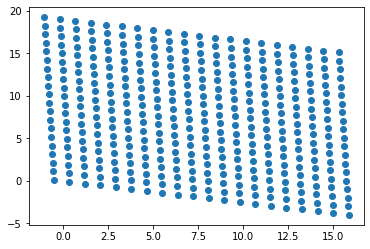

In [22]:
plt.scatter(new[:,:,0].reshape(-1), new[:,:,1].reshape(-1))# 
plt.savefig('david_h1_10.png')
plt.show()

In [24]:
def plot_pointCloud(pc, path='plot.html'):
    '''
    plots the Nx6 point cloud pc in 3D
    assumes (1,0,0), (0,1,0), (0,0,-1) as basis
    '''
    fig = go.Figure(data=[go.Scatter3d(
        x=pc[:, 0],
        y=pc[:, 1],
        z=-pc[:, 2],
        mode='markers',
        marker=dict(
            size=2,
            color=pc[:, 3:][..., ::-1],
            opacity=0.8
        )
    )])
    fig.write_html("8point_SIFT_pc1_10.html")
    fig.show()

In [ ]:
plot_pointCloud(pc1)